# 1. Importing necessary packages

In [1]:
import tensorflow as tf
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
#import pandas as pd
import matplotlib.pyplot as plt
from absl import logging
import os
import xml.etree.ElementTree as et
import random
import time

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#2. YOLOv3 model building

## 2.1 Model preparation

In [3]:
# normalize the anchors for universal use of various image sizes
# anchor sizes are taken from the original yolov3 paper
anchors = np.array([(10, 13), (16, 30), (33, 23),
                    (30, 61), (62, 45), (59, 119),
                    (116, 90), (156, 198), (373, 326)],
                   np.float32) / 416
                
anchor_masks = np.array([[6, 7, 8], [3, 4, 5], [0, 1, 2]])

yolo_max_boxes = 120
yolo_iou_threshold = 0.5
yolo_score_threshold = 0.5

labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck",
	"boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench",
	"bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe",
	"backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard",
	"sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard",
	"tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana",
	"apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake",
	"chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse",
	"remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
	"book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]

##2.2 Main building block (darknet)

Darknet main model taken from the original YOLOv3 paper

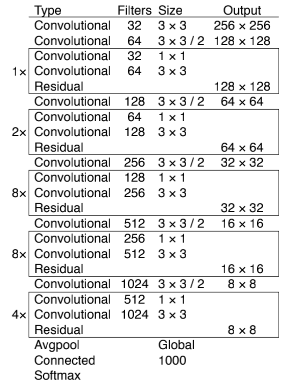

In [4]:
# Convolution Block Function

def Conv(x, filters, size, strides=1, batch_norm=True):
  if strides == 1:
    padding = 'same'
  else:
    x = tf.keras.layers.ZeroPadding2D(((1, 0), (1, 0)))(x)
    padding = 'valid'
  x = tf.keras.layers.Conv2D(filters=filters, kernel_size=size,
                             strides=strides, padding=padding,
                             use_bias=not batch_norm, kernel_regularizer=tf.keras.regularizers.l2(0.0005))(x)
  if batch_norm:
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
  return x

In [5]:
# Residual Block Function

def Residual(x, filters):
  x1 = Conv(x, filters//2, 1)
  x1 = Conv(x1, filters, 3)
  return tf.keras.layers.Add()([x, x1])

In [6]:
# One Complete Darknet Residual Block

def DarknetRes(x, filters, blocks):
  x = Conv(x, filters, 3, 2)
  for _ in range(blocks):
    x = Residual(x, filters)
  return x

In [7]:
# Full Main Darknet Model

def Darknet(name=None):
  x = inputs = tf.keras.layers.Input([None, None, 3])
  x = Conv(x, 32, 3)
  x = DarknetRes(x, 64, 1)
  x = DarknetRes(x, 128, 2)
  x = x1 = DarknetRes(x, 256, 8)
  x = x2 = DarknetRes(x, 512, 8)
  x = x3 = DarknetRes(x, 1024, 4)
  return tf.keras.Model(inputs, (x1, x2, x3), name=name)

## 2.3 Output processing layers

YOLOv3 output processing model

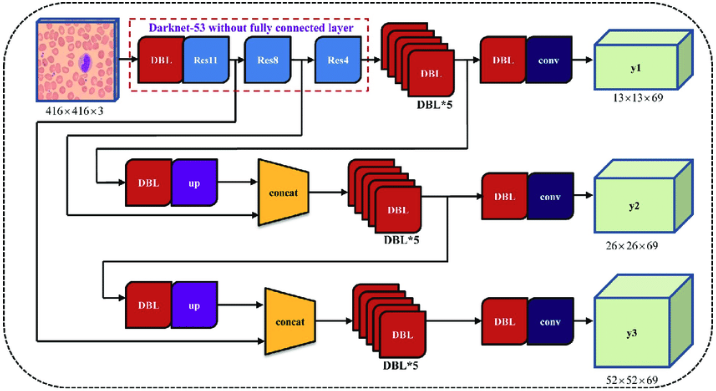

In [8]:
# First Output Processing Block

def YoloConv(filters, name=None):
  def yolo_conv(x_in):
    if isinstance(x_in, tuple):
      inputs = tf.keras.layers.Input(x_in[0].shape[1:]), tf.keras.layers.Input(x_in[1].shape[1:])
      x, x_skip = inputs
      x = Conv(x, filters, 1)
      x = tf.keras.layers.UpSampling2D(2)(x)
      x = tf.keras.layers.Concatenate()([x, x_skip])
    else:
      x = inputs = tf.keras.layers.Input(x_in.shape[1:])

    x = Conv(x, filters, 1)
    x = Conv(x, filters*2, 3)
    x = Conv(x, filters, 1)
    x = Conv(x, filters*2, 3)
    x = Conv(x, filters, 1)

    return tf.keras.Model(inputs, x, name=name)(x_in)
  return yolo_conv

In [9]:
# Final Output Processing Block
# Including reshaping output into shape [batch_size, gridx, gridy, anchors, (x, y, w, h, obj, ...classes)]

def YoloOut(filters, anchors, classes, name=None):
  def yolo_output(x_in):
    x = inputs = tf.keras.layers.Input(x_in.shape[1:])
    x = Conv(x, filters*2, 3)
    x = Conv(x, anchors*(5+classes), 1, batch_norm=False) #usually 255 filters since anchors=3, classes=80, thus 3*(80+5)=255
    # reshape layer
    x = tf.keras.layers.Lambda(lambda x:tf.reshape(x, (-1, tf.shape(x)[1], tf.shape(x)[2], anchors, 5+classes)))(x)
    return tf.keras.Model(inputs, x, name=name)(x_in)
  return yolo_output

##2.4 Yolov3 Model

In [10]:
# Full Darknet Model including the output processing model

def Yolov3(size=None, channels=3, anchors=anchors, masks=anchor_masks,
           classes=80):
  x = input = tf.keras.layers.Input([size, size, channels], name='input')

  x1, x2, x3 = Darknet(name='yolo_darknet')(x)

  x = YoloConv(512, name='conv_small')(x3)
  x_small = YoloOut(512, len(masks[0]), classes, name='output_small')(x)

  x = YoloConv(256, name='conv_med')((x, x2))
  x_med = YoloOut(256, len(masks[1]), classes, name='output_med')(x)

  x = YoloConv(128, name='conv_big')((x, x1))
  x_big = YoloOut(128, len(masks[2]), classes, name='output_big')(x)

  # small, med, big refers to the grid size of the output
  return tf.keras.Model(input, (x_small, x_med, x_big), name='yolov3')

In [11]:
# Creating model
yolov3_model = Yolov3()
yolov3_model.summary()

Model: "yolov3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 yolo_darknet (Functional)      ((None, None, None,  40620640    ['input[0][0]']                  
                                 256),                                                            
                                 (None, None, None,                                               
                                 512),                                                            
                                 (None, None, None,                                          

In [12]:
# Function to import pretrained model weight from YOLO website

YOLOV3_LAYER_LIST = [
    'yolo_darknet',
    'conv_small',
    'output_small',
    'conv_med',
    'output_med',
    'conv_big',
    'output_big',
]

def load_darknet_weights(model, weights_file, layers=YOLOV3_LAYER_LIST):
  wf = open(weights_file, 'rb')
  major, minor, revision, seen, _ = np.fromfile(wf, dtype=np.int32, count=5)

  for layer_name in layers:
    sub_model = model.get_layer(layer_name)
    for i, layer in enumerate(sub_model.layers):
      if not layer.name.startswith('conv2d'):
        continue
      batch_norm = None
      if i + 1 < len(sub_model.layers) and \
          sub_model.layers[i + 1].name.startswith('batch_norm'):
        batch_norm = sub_model.layers[i + 1]

      logging.info("{}/{} {}".format(
          sub_model.name, layer.name, 'bn' if batch_norm else 'bias'))
      
      filters = layer.filters
      size = layer.kernel_size[0]
      in_dim = layer.get_input_shape_at(0)[-1]
      
      if batch_norm is None:
        conv_bias = np.fromfile(wf, dtype=np.float32, count=filters)
      else:
        # darknet [beta, gamma, mean, variance]
        bn_weights = np.fromfile(
            wf, dtype=np.float32, count=4 * filters)
        # tf [gamma, beta, mean, variance]
        bn_weights = bn_weights.reshape((4, filters))[[1, 0, 2, 3]]
        
      # darknet shape (out_dim, in_dim, height, width)
      conv_shape = (filters, in_dim, size, size)
      conv_weights = np.fromfile(
          wf, dtype=np.float32, count=np.product(conv_shape))
      # tf shape (height, width, in_dim, out_dim)
      conv_weights = conv_weights.reshape(
          conv_shape).transpose([2, 3, 1, 0])
          
      if batch_norm is None:
        layer.set_weights([conv_weights, conv_bias])
      else:
        layer.set_weights([conv_weights])
        batch_norm.set_weights(bn_weights)

  assert len(wf.read()) == 0, 'failed to read all data'
  wf.close()

In [13]:
# Loading weights and testing

load_darknet_weights(yolov3_model, '/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/yolov3.weights')
print('weights loaded')

img = np.random.random((1,320,320,3)).astype(np.float32)
output = yolov3_model(img)
print('sanity check passed')

weights loaded
sanity check passed


## 2.5 Output Processing

Functions to process the model outputs into bounding box coordinates

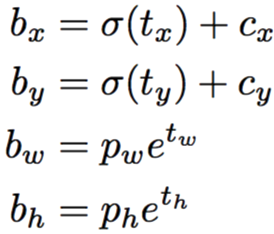

In [14]:
# meshgrid function to imitate grids on the image

def meshgrid_(x, y):
  x, y = tf.meshgrid(tf.range(x), tf.range(y))
  grid = tf.stack((x, y), axis=-1)
  return grid

In [15]:
# Function to process the model ouputs

def YoloBox(pred, anchors, classes):
  # pred: [batch_size, grid, grid, anchors, (x, y, w, h, obj, ...classes)]
  grid_size = tf.shape(pred)[1:3]
  box_xy, box_wh, obj, classprob = tf.split(pred, [2, 2, 1, classes], axis=-1)

  box_xy = tf.sigmoid(box_xy) # in range(0,1)
  obj = tf.sigmoid(obj) # in range (0,1)
  classprob = tf.sigmoid(classprob) #in range (0,1)
  boxpred = tf.concat((box_xy, box_wh), axis=-1) #for loss in training

  '''REMINDER: the anchors have been normalized with 416'''
  grid = meshgrid_(grid_size[1], grid_size[0])
  grid = tf.cast(grid, tf.float32)
  grid = tf.expand_dims(grid, axis=2)

  box_xy = (box_xy+tf.cast(grid, tf.float32))/tf.cast(grid_size, dtype=tf.float32) # in range (0,1)
  box_wh = tf.exp(box_wh)*anchors

  box_x1y1 = box_xy-box_wh/2
  box_x2y2 = box_xy+box_wh/2
  bbox = tf.concat((box_x1y1, box_x2y2), axis=-1)

  return bbox, obj, classprob, boxpred

In [16]:
# Function to apply Non Max Suppression to boxes

def YoloNMS(outputs, anchors, masks, classes):
  
  b, c, t = [], [], []
  for o in outputs:
    b.append(tf.reshape(o[0], (tf.shape(o[0])[0], -1, tf.shape(o[0])[-1])))
    c.append(tf.reshape(o[1], (tf.shape(o[1])[0], -1, tf.shape(o[1])[-1])))
    t.append(tf.reshape(o[2], (tf.shape(o[2])[0], -1, tf.shape(o[2])[-1])))

  bbox = tf.concat(b, axis=1) #[1, grid*grid*anchors, coordinates(4)]
  conf = tf.concat(c, axis=1) #[1, grid*grid*anchors, conf(1)]
  classprob = tf.concat(t, axis=1) #[1, grid*grid*anchors, classprob(80)]

  if classes ==1:
    scores = conf
  else:
    scores = conf * classprob

  classes = tf.argmax(scores, 2) #[1, grid*grid*anchors, maxprob_class(1)]
  scores = tf.reduce_max(scores, [-1]) #[1, grid*grid*anchors, scores(1)]

  box_yx = bbox[0]
  
  selected_indices, selected_scores = tf.image.non_max_suppression_with_scores(
      boxes=bbox[0], #[grid*grid*anchors, coordinates(4)]
      scores=scores[0], #[grid*grid*anchors, scores(1)]
      max_output_size=yolo_max_boxes,
      iou_threshold=yolo_iou_threshold,
      score_threshold=yolo_score_threshold,
      soft_nms_sigma=0.4
  )

  num_valid_boxes = tf.shape(selected_indices)[0] #integer
  selected_boxes = tf.gather(bbox[0], selected_indices) #[num_valid_boxes, 4]
  selected_classes = tf.gather(classes[0], selected_indices) #[num_valid_boxes, 1]

  return selected_boxes, selected_scores, selected_classes, num_valid_boxes

In [17]:
# Full function to process the model output into bounding boxes, scores, and classes

def yolo_box_pred(model, anchors=anchors, masks=anchor_masks, classes=80):
  def detect(img):
    preds = model.predict(img)

    batch_size = img.shape[0]
    predictions = []
    # Find Bounding Box for every image in a batch
    for i in range(batch_size):
      out0 = tf.expand_dims(preds[0][i], axis=0)
      out0 = YoloBox(out0, anchors[masks[0]], classes)
      out1 = tf.expand_dims(preds[1][i], axis=0)
      out1 = YoloBox(out1, anchors[masks[1]], classes)
      out2 = tf.expand_dims(preds[2][i], axis=0)
      out2 = YoloBox(out2, anchors[masks[2]], classes)

      outputs = YoloNMS((out0, out1, out2), anchors, masks, classes)
      predictions.append(outputs)
    
    return predictions
  return detect

#3. Object Detection on Some Image(s)

##3.1 Image preprocessing

In [18]:
# Function to preprocess input image(s)

def preprocess_imgs(imgs, size):
  imgs = tf.image.resize(imgs, (size, size))
  imgs = imgs/255
  return imgs

In [19]:
# Function to draw bounding box for a single image

def draw_outputs(img, outputs, class_names):
    boxes, objectness, classes, nums = outputs
    #boxes, objectness, classes, nums = boxes[0], objectness[0], classes[0], nums[0]
    wh = np.flip(img.shape[0:2])
    boxes = tf.clip_by_value(boxes, 0., 1.)
    for i in range(nums):
        x1y1 = tuple((np.array(boxes[i][0:2]) * wh).astype(np.int32))
        x2y2 = tuple((np.array(boxes[i][2:4]) * wh).astype(np.int32))
        img = cv2.rectangle(img, x1y1, x2y2, (255, 0, 0), 2)
        img = cv2.putText(img, '{} {:.4f}'.format(
            class_names[int(classes[i])], objectness[i]),
            x1y1, cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 255), 2)
    return img

## 3.2 Trials

These are some object detection results from the pretrained model using random test images

In [24]:
img_raw = tf.image.decode_image(
    open('/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/meme.jpg', 'rb').read(), channels=3)
img = tf.expand_dims(img_raw, 0)
img = preprocess_imgs(img, 416)
trial0 = yolo_box_pred(yolov3_model)(img)
img = cv2.cvtColor(img_raw.numpy(), cv2.COLOR_RGB2BGR)
#img = draw_outputs(img, (boxes, scores, classes, nums), class_names)
img = draw_outputs(img, trial0[0], labels)
print(int(trial0[0][-1]))
for i in range(trial0[0][-1]):
  print(labels[int(trial0[0][2][i])], 
        np.array(trial0[0][1][i], np.float32), 
        np.array(trial0[0][0][i], np.float32))

6
cup 0.99807304 [0.1426622  0.52777606 0.27184254 0.65748256]
person 0.99769753 [0.28982916 0.0985465  0.95846486 0.9202168 ]
laptop 0.95392716 [-0.01710653  0.3949369   0.5229728   0.7962775 ]
apple 0.90813637 [0.13114461 0.77143586 0.22893354 0.90729535]
cell phone 0.7315034 [0.18850096 0.87569416 0.33501852 0.9422209 ]
clock 0.66991264 [0.4010809  0.2124461  0.49267417 0.35021502]


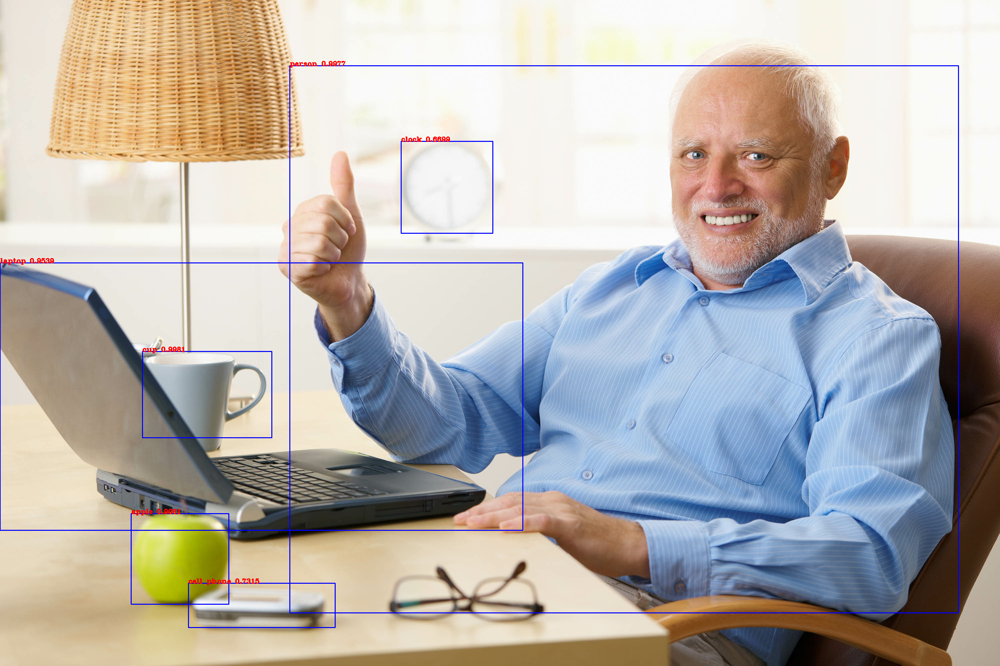

In [25]:
cv2_imshow(img)

In [26]:
img2_raw = tf.image.decode_image(
    open('/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/meme2.jpeg', 'rb').read(), channels=3)
img2 = tf.expand_dims(img2_raw, 0)
img2 = preprocess_imgs(img2, 416)
trial1 = yolo_box_pred(yolov3_model)(img2)
img2 = cv2.cvtColor(img2_raw.numpy(), cv2.COLOR_RGB2BGR)
#img = draw_outputs(img2, (boxes, scores, classes, nums), class_names)
img2 = draw_outputs(img2, trial1[0], labels)
print(int(trial1[0][-1]))
for i in range(trial1[0][-1]):
  print(labels[int(trial1[0][2][i])], 
        np.array(trial1[0][1][i], np.float32), 
        np.array(trial1[0][0][i], np.float32))

5
person 0.9996727 [0.10497868 0.17179078 0.47821975 0.99576515]
person 0.9942639 [0.4560235  0.06149828 0.7274452  0.98329854]
person 0.95541734 [0.7069311  0.22946662 0.91559696 1.0209918 ]
person 0.91029125 [0.93971944 0.43444303 1.0022458  0.89688945]
person 0.6183155 [0.08753047 0.41167542 0.18400961 0.7732612 ]


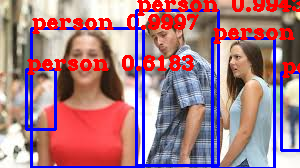

In [27]:
cv2_imshow(img2)

In [28]:
img3_raw = tf.image.decode_image(
    open('/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/street.jpg', 'rb').read(), channels=3)
img3 = tf.expand_dims(img3_raw, 0)
img3 = preprocess_imgs(img3, 416)
trial2 = yolo_box_pred(yolov3_model)(img3)
img3 = cv2.cvtColor(img3_raw.numpy(), cv2.COLOR_RGB2BGR)
#img = draw_outputs(img2, (boxes, scores, classes, nums), class_names)
img3 = draw_outputs(img3, trial2[0], labels)
print(int(trial2[0][-1]))
for i in range(trial2[0][-1]):
  print(labels[int(trial2[0][2][i])], 
        np.array(trial2[0][1][i], np.float32), 
        np.array(trial2[0][0][i], np.float32))

11
car 0.9966801 [0.26270664 0.34669653 0.40587908 0.5401914 ]
bus 0.99511975 [0.67014587 0.17855005 0.9937171  0.5290145 ]
person 0.9868989 [0.6138847  0.34505445 0.68770576 0.77529997]
bus 0.97954243 [0.32288754 0.15145975 0.6138201  0.506682  ]
person 0.9747289 [0.22922696 0.34322938 0.26619264 0.52385163]
person 0.9731234 [0.10603387 0.29673994 0.14109921 0.52050036]
person 0.96544784 [0.6745359  0.3669306  0.76731586 0.806561  ]
person 0.8403733 [0.73152274 0.19712627 0.76029474 0.2559415 ]
person 0.7661856 [0.14938346 0.30133063 0.20066255 0.5780297 ]
person 0.6201163 [0.8069899  0.19955894 0.82683456 0.24689198]
traffic light 0.5584406 [0.2863981  0.26624355 0.29791862 0.28726056]


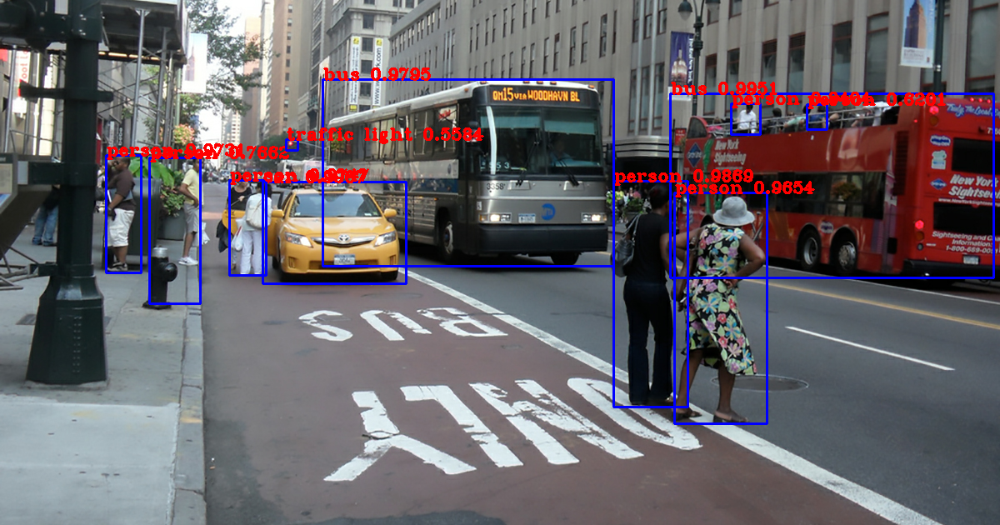

In [29]:
cv2_imshow(img3)

In [30]:
img4_raw = tf.image.decode_image(
    open('/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/Screen Shot 2021-11-10 at 13.59.02.png', 'rb').read(), channels=3)
img4 = tf.expand_dims(img4_raw, 0)
img4 = preprocess_imgs(img4, 416)
trial3 = yolo_box_pred(yolov3_model)(img4)
img4 = cv2.cvtColor(img4_raw.numpy(), cv2.COLOR_RGB2BGR)
#img = draw_outputs(img2, (boxes, scores, classes, nums), class_names)
img4 = draw_outputs(img4, trial3[0], labels)
print(int(trial3[0][-1]))
for i in range(trial3[0][-1]):
  print(labels[int(trial3[0][2][i])], 
        np.array(trial3[0][1][i], np.float32), 
        np.array(trial3[0][0][i], np.float32))

8
person 0.9990989 [0.15466423 0.15728632 0.40911824 0.8526845 ]
person 0.9990419 [0.46120006 0.09730417 0.6824234  0.886121  ]
bicycle 0.9988203 [0.68337935 0.43780738 0.89406365 1.0111594 ]
bicycle 0.8129162 [0.4947805 0.4415154 0.6317891 0.9850312]
person 0.78187156 [0.6163262  0.10550925 0.90704954 0.92470336]
person 0.77656305 [0.3096034  0.15266556 0.4278221  0.8061036 ]
bicycle 0.6965923 [0.17413336 0.42232743 0.40412426 1.0003085 ]
bench 0.6279362 [0.00286342 0.6659842  0.06522444 0.83911854]


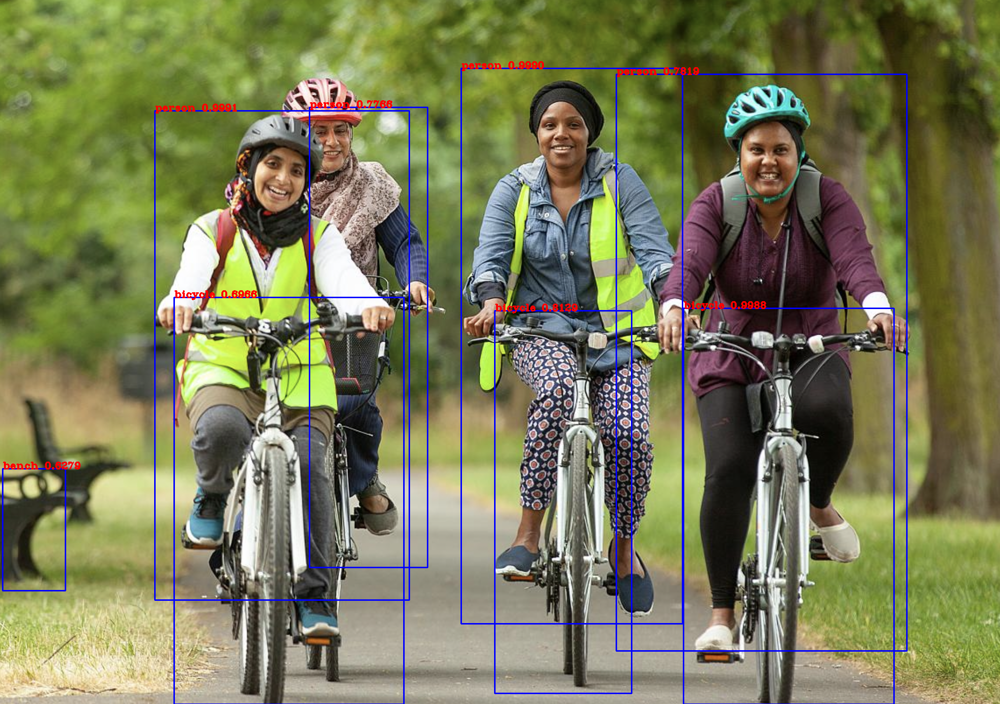

In [31]:
 cv2_imshow(img4)

#4. Tools for Training Custon Model

## 4.1 Loss Function

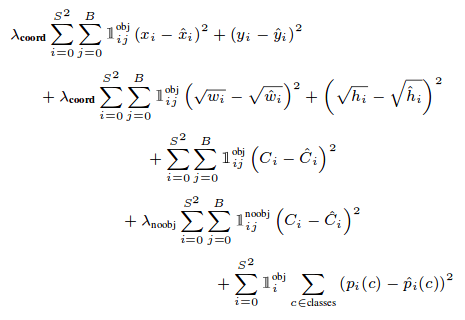

This is the original YOLO loss function. Up to the 2nd YOLO version, the loss function hasn't been changed. For YOLOv3, there's a few changes in the loss function. Notice the last three terms in the original YOLO loss function, those three terms are using squared errors, whereas in YOLOv3 they've been replaced by cross-entropy error terms.

In [20]:
# function to find iou between prediction boxes and true boxes

def broadcast_iou(box1, box2):
  # box1: pred boxes with shape (batch, grid, grid, anchors, 4)
  # box2: true boxes with shape (num of true box with an object (N), 4)
  # expand dimension of both tensors so they can be broadcasted
  box1 = tf.expand_dims(box1, -2)
  box2 = tf.expand_dims(box2, 0)

  # Find the right shape to broadcast the two tensors
  broadcast_shape = tf.broadcast_dynamic_shape(tf.shape(box1), tf.shape(box2))
  box1 = tf.broadcast_to(box1, broadcast_shape)
  box2 = tf.broadcast_to(box2, broadcast_shape)

  # Calculate iou
  int_w = tf.maximum(tf.minimum(box1[..., 2], box2[..., 2]) - tf.maximum(box1[..., 0], box2[..., 0]), 0)
  int_h = tf.maximum(tf.minimum(box1[..., 3], box2[..., 3]) - tf.maximum(box1[..., 1], box2[..., 1]), 0)
  int_area = int_w * int_h
  box_1_area = (box1[..., 2] - box1[..., 0]) * (box1[..., 3] - box1[..., 1])
  box_2_area = (box2[..., 2] - box2[..., 0]) * (box2[..., 3] - box2[..., 1])

  return int_area/(box_1_area + box_2_area -int_area)

In [21]:
# create yolo loss function using inner function
# so then it can be used for training

def YoloLoss(anchors, classes, ignore_thresh=0.5):
  def yolo_loss(y_true, y_pred):
    # 1. transform all prediction outputs
    pred_box, pred_obj, pred_class, pred_xywh= YoloBox(y_pred, anchors, classes)
    # split xy and wh
    pred_xy = pred_xywh[..., 0:2]
    pred_wh = pred_xywh[..., 2:4]

    # 2. transform all true outputs to xy and wh
    true_box, true_obj, true_class_idx = tf.split(y_true, [4, 1, 1], axis=-1)
    true_xy = (true_box[..., 0:2] + true_box[..., 2:4])/2
    true_wh = true_box[..., 2:4] - true_box[..., 0:2]

    #give higher loss to small boxes
    box_loss_scale = 2-true_wh[..., 0] * true_wh[..., 1]

    # 3. invert true_box to the same format as model output
    grid_size = tf.shape(y_true)[1]
    grid = meshgrid_(grid_size, grid_size)
    grid = tf.expand_dims(tf.convert_to_tensor(grid, dtype=tf.int32), axis=2)
    true_xy = true_xy * tf.cast(grid_size, dtype=tf.float32) - tf.cast(grid, tf.float32)
    #print(true_wh.shape)
    true_wh = tf.math.log(true_wh / tf.convert_to_tensor(anchors, tf.float32))
    true_wh = tf.where(tf.math.is_inf(true_wh), tf.zeros_like(true_wh), true_wh)

    # 4. calculate all masks
    # true_obj in shape [batch, grid, grid, anchors, obj(1)] -> [batch, grid, grid, anchors]
    obj_mask = tf.squeeze(true_obj, axis=-1)
    best_iou = tf.map_fn(
        lambda x: tf.reduce_max(broadcast_iou(x[0], tf.boolean_mask(x[1], tf.cast(x[2], tf.bool))), axis=-1),
        (pred_box, true_box, obj_mask),
        tf.float32
    )
    ignore_mask = tf.cast(best_iou<ignore_thresh, tf.float32)

    # 5. calculate all losses
    xy_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_xy - pred_xy), axis=-1)
    wh_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_wh - pred_wh), axis=-1)
    obj_loss = obj_mask * tf.keras.losses.binary_crossentropy(true_obj, pred_obj)
    noobj_loss = (1 - obj_mask) * tf.keras.losses.binary_crossentropy(true_obj, pred_obj) * ignore_mask
    class_loss = obj_mask * tf.keras.losses.sparse_categorical_crossentropy(true_class_idx, pred_class)

    # 6. sum all losses
    total_loss = tf.reduce_sum(xy_loss) + tf.reduce_sum(wh_loss) + tf.reduce_sum(obj_loss) + tf.reduce_sum(noobj_loss) + tf.reduce_sum(class_loss)
    return total_loss
  return yolo_loss


In [22]:
# saving the model weights so it can be used for may more model customizations
# including custom number of classes

#yolov3_model.save_weights('/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/yolov3_weights.tf')

## 4.2 Model Building

For this particular model, 3 types of configurations are provided.
> 1. none: Train model without transfer learning
> 2. fine_tune: Fine tune the upper layers of the model. This config can only be done with the same number of classes as the original model (80)
> 3. no_output: only train the output layer from scratch. this can be done with any number of classes

In [23]:
model_dir = '/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/yolov3_weights.tf'
learning_rate = 1e-3

def new_custom_model(size, num_classes, transfer='none'):
  # transfer choices = 'none', 'fine_tune', 'no_output'
  yolov3_new = Yolov3(size=size, classes=num_classes)
  anchors_ = anchors
  masks = anchor_masks

  # configure model for transfer learning
  if transfer == 'none':
    pass
  elif transfer == 'fine_tune' and num_classes == 80:
    yolov3_new.load_weights(model_dir)
    darknet = yolov3_new.get_layer('yolo_darknet')
    darknet.trainable = False
  elif transfer == 'no_output' or num_classes != 80:
    base_model = Yolov3(size=size, classes=80)
    base_model.load_weights(model_dir)
    for l in yolov3_new.layers:
      if not l.name.startswith('output'):
        l.set_weights(base_model.get_layer(l.name).get_weights())
        l.trainable = False

  optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
  loss = [YoloLoss(anchors_[mask], classes=num_classes) for mask in masks]

  yolov3_new.compile(optimizer=optimizer,
                loss=loss)
  
  return yolov3_new

In [95]:
# testing build new model 

new_model = new_custom_model(416, 3, 'no_output')
new_model.summary()

Model: "yolov3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 416, 416, 3  0           []                               
                                )]                                                                
                                                                                                  
 yolo_darknet (Functional)      ((None, None, None,  40620640    ['input[0][0]']                  
                                 256),                                                            
                                 (None, None, None,                                               
                                 512),                                                            
                                 (None, None, None,                                          

# 5. Loading New Dataset

In [25]:
# labels for the new dataset

new_labels = ['with_mask', 'without_mask', 'mask_weared_incorrect']

## 5.1 Loading and Processing Targets

This process includes loading target data from xml file and processing the data into usable format for training

In [26]:
# function to extract data from xml file

def process_xml(dataset_path, labels):
  img_files = []
  y_true = []
  for xml_file in os.listdir(dataset_path):
    tree = et.parse(os.path.join(dataset_path, xml_file))
    root = tree.getroot()
    # take image filename
    img_files.append(root[1].text)

    imgdat = []
    # loop over every object data in an image
    for obj in root.iter('object'):
      coorobj = []
      for i in range(2):
        # take object cooridinates and normalize to coresponding image size
        coorobj.append(float(obj[5][i*2].text)/float(root[2][0].text)) # x / width
        coorobj.append(float(obj[5][i*2+1].text)/float(root[2][1].text)) # y / height

      coorobj.append(labels.index(obj[0].text))
      imgdat.append(coorobj)

    y_true.append(imgdat)

  return y_true, img_files

In [27]:
# function to convert extracted data to tensor format

def list_to_tensor(y_true):
  # inputs: list of targets
  # ouputs: tensor with shape [N, boxes, (coordinates(4), class)]
  maxlen = 0
  for y in y_true:
    if len(y) > maxlen:
      maxlen = len(y)
  
  for i in range(len(y_true)):
    dif = maxlen - len(y_true[i])
    # add padding so every item in list are in the same shape
    y_true[i] += [[0, 0, 0, 0, 0]] * dif

  y_true_tensor = tf.convert_to_tensor(y_true, tf.float32)
  return y_true_tensor

In [28]:
def transform_to_output_format(y_true, grid_size, anchor_idxs):
  # inputs: [N, boxes, (coordinates(4), class, best_anchor)]
  # outputs: [N, grid, grid, anchors, (coordinates(4), obj, class)]
  N = y_true.shape[0]

  y_true_out = tf.zeros(
      (N, grid_size, grid_size, anchor_idxs.shape[0], 6)
  )

  anchor_idxs = tf.cast(anchor_idxs, tf.int32)

  indexes = tf.TensorArray(tf.int32, 1, dynamic_size=True)
  updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)
  idx = 0
  for i in tf.range(N):
      for j in tf.range(tf.shape(y_true)[1]):
          if tf.equal(y_true[i][j][2], 0):
              continue
          anchor_eq = tf.equal(
              anchor_idxs, tf.cast(y_true[i][j][5], tf.int32))

          if tf.reduce_any(anchor_eq):
              box = y_true[i][j][0:4]
              box_xy = (y_true[i][j][0:2] + y_true[i][j][2:4]) / 2

              anchor_idx = tf.cast(tf.where(anchor_eq), tf.int32)
              grid_xy = tf.cast(box_xy // (1/grid_size), tf.int32)

              # grid[y][x][anchor] = (tx, ty, bw, bh, obj, class)
              indexes = indexes.write(
                  idx, [i, grid_xy[1], grid_xy[0], anchor_idx[0][0]])
              updates = updates.write(
                  idx, [box[0], box[1], box[2], box[3], 1, y_true[i][j][4]])
              idx += 1

  return tf.tensor_scatter_nd_update(
      y_true_out, indexes.stack(), updates.stack())

def transform_targets(y_true, anchors, anchor_masks, size):
  
  # 1. add anchor index to y_true
  grid_size = size // 32

  anchors = tf.cast(anchors, tf.float32)
  anchor_area = anchors[..., 0] * anchors[..., 1] #[anchors, 2]
  box_wh = y_true[..., 2:4] - y_true[..., 0:2] #[N, boxes, 2]
  box_wh = tf.tile(tf.expand_dims(box_wh, axis=-2), # expand dims into shape [N, boxes, 1, 2]
                   (1, 1, tf.shape(anchors)[0],1)) # tile into shape [N, boxes, anchors, xy(2)]
  box_area = box_wh[..., 0] * box_wh[..., 1]
  intersection = tf.minimum(box_wh[..., 0], anchors[..., 0]) * tf.minimum(box_wh[..., 1], anchors[..., 1])
  union = anchor_area + box_area - intersection
  iou = intersection / union
  choosen_anchors = tf.cast(tf.argmax(iou, axis=-1), tf.float32)
  y_true = tf.concat((y_true, tf.expand_dims(choosen_anchors, axis=-1)), axis=-1) #[N, boxes, (coordinates(4), class, best_anchor)]
  print(y_true.shape)

  # 2. transform y_true from [N, boxes, (coordinates(4), class, best_anchor)]
  # to [N, grid, grid, anchors, (coordinates(4), obj, class)]
  y_outs = []

  for anchor_idxs in anchor_masks:
    y_outs.append(transform_to_output_format(y_true, grid_size, anchor_idxs))
    grid_size *= 2
    print("a grid done")

  return tuple(y_outs)

In [73]:
dat_path = '/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/Dataset/Mask detection/annotations'

y_coord, y_files = process_xml(dat_path, new_labels)

In [74]:
# check the amount of labes for each class across al dataset

counter = [0, 0, 0]
for img in y_coord:
  for coord in img:
    counter[coord[4]] += 1
print(counter)

[3280, 719, 123]


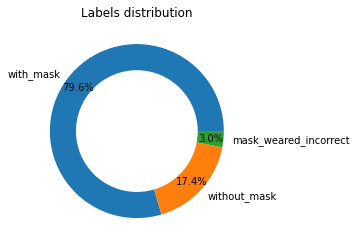

In [77]:
plt.pie(counter, labels=new_labels,
        autopct='%1.1f%%', pctdistance=0.85)
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
  
# Adding Title of chart
plt.title('Labels distribution')
  
# Displaing Chart
plt.show()

In [78]:
y_target = list_to_tensor(y_coord)
print(y_target.shape)

(863, 115, 5)


In [79]:
y_output = transform_targets(y_target, anchors, anchor_masks, 416)

(863, 115, 6)
a grid done
a grid done
a grid done


In [80]:
# cheking the shapes of target

print(y_output[0].shape, y_output[1].shape, y_output[2].shape)

(863, 13, 13, 3, 6) (863, 26, 26, 3, 6) (863, 52, 52, 3, 6)


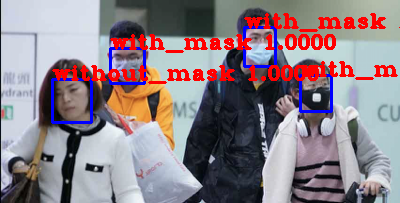

In [88]:
# visualizing one random example using one of the data that already processed

boxes = []
scores = []
classs = []
grid = 13
idx = random.randint(0, y_output[0].shape[0])
for outs in y_output:
  choosen = outs[idx]
  for i in range(grid):
    for j in range(grid):
      for k in range(3):
        if choosen[i][j][k][0] == 0 and choosen[i][j][k][2] == 0:
          continue
        boxes.append(choosen[i][j][k][0:4])
        scores.append(1)
        classs.append(choosen[i][j][k][5])
  grid *= 2
nums = len(boxes)
#boxes = [boxes]
#scores = [scores]
#classs = [classs]

img_raw100 = tf.image.decode_image(
    open('/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/Dataset/Mask detection/images/' + y_files[idx], 'rb').read(), channels=3)
#trial0 = yolo_box_pred(yolov3_model)(img)
img100 = cv2.cvtColor(img_raw100.numpy(), cv2.COLOR_RGB2BGR)
img100 = draw_outputs(img100, [boxes, scores, classs, nums], new_labels)

cv2_imshow(img100)

## 5.2 Loading and Processing Images

In [39]:
# function to load images

def load_imgs(img_path, img_files, size):
  imgs = []
  for img_file in img_files:
    img = tf.image.decode_image(
        open(os.path.join(img_path, img_file), 'rb').read(), channels=3
    )
    img = preprocess_imgs(img, size)
    imgs.append(img)
  imgs = tf.convert_to_tensor(imgs, tf.float32)
  return imgs

In [40]:
img_path = '/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/Dataset/Mask detection/images'
img_data = load_imgs(img_path, y_files, 416)
img_data.shape

TensorShape([863, 416, 416, 3])

## 5.3 Creating Dataset

In [91]:
# creating tensorflow dataset for train set and validation set

def create_dataset(img_data, y_output, train_size=0.9):
    dataset = tf.data.Dataset.from_tensor_slices((img_data, y_output))
    dataset = dataset.shuffle(buffer_size=256, seed=27)

    traindata = int(img_data.shape[0] * train_size)
    train_set = dataset.take(traindata)
    train_set = train_set.batch(8)
    val_set = dataset.skip(traindata).take(img_data.shape[0] - traindata)
    val_set = val_set.batch(8)
    return train_set, val_set

In [92]:
train_set, val_set = create_dataset(img_data, y_output)

# 6. Training from New Model

## 6.1 Training

In [93]:
# set callbacks
callbacks = [
             tf.keras.callbacks.ReduceLROnPlateau(verbose=1),
             tf.keras.callbacks.EarlyStopping(patience=3, verbose=1)
]

In [96]:
# train the model

start_time = time.time()
epochs = 15
history = new_model.fit(train_set,
                        epochs=epochs,
                        callbacks=callbacks,
                        validation_data=val_set)
end_time = time.time() - start_time
print(f'Total Training Time: {end_time}')

Epoch 1/15
97/97 [==============================] - 1125s 11s/step - loss: 9786.6543 - output_small_loss: 398.7266 - output_med_loss: 1095.3711 - output_big_loss: 8282.5400 - val_loss: 2818.9473 - val_output_small_loss: 38.5281 - val_output_med_loss: 277.0112 - val_output_big_loss: 2493.3728 - lr: 0.0010
Epoch 2/15
97/97 [==============================] - 1100s 11s/step - loss: 907.7449 - output_small_loss: 37.6233 - output_med_loss: 108.2927 - output_big_loss: 751.7889 - val_loss: 779.9688 - val_output_small_loss: 23.5520 - val_output_med_loss: 121.3100 - val_output_big_loss: 625.0631 - lr: 0.0010
Epoch 3/15
97/97 [==============================] - 1100s 11s/step - loss: 504.0350 - output_small_loss: 19.9389 - output_med_loss: 79.3760 - output_big_loss: 394.6736 - val_loss: 418.3251 - val_output_small_loss: 12.6801 - val_output_med_loss: 96.4372 - val_output_big_loss: 299.1580 - lr: 0.0010
Epoch 4/15
97/97 [==============================] - 1101s 11s/step - loss: 343.7192 - output_sma

In [97]:
new_model.save_weights('/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/yolov3_custom_weights(3 outputs).h5')

## 6.2 Testing

2
with_mask 0.73518384 [0.5199492  0.35066038 0.6161984  0.49372506]
with_mask 0.5283736 [0.73358995 0.23587206 0.81112915 0.38653937]


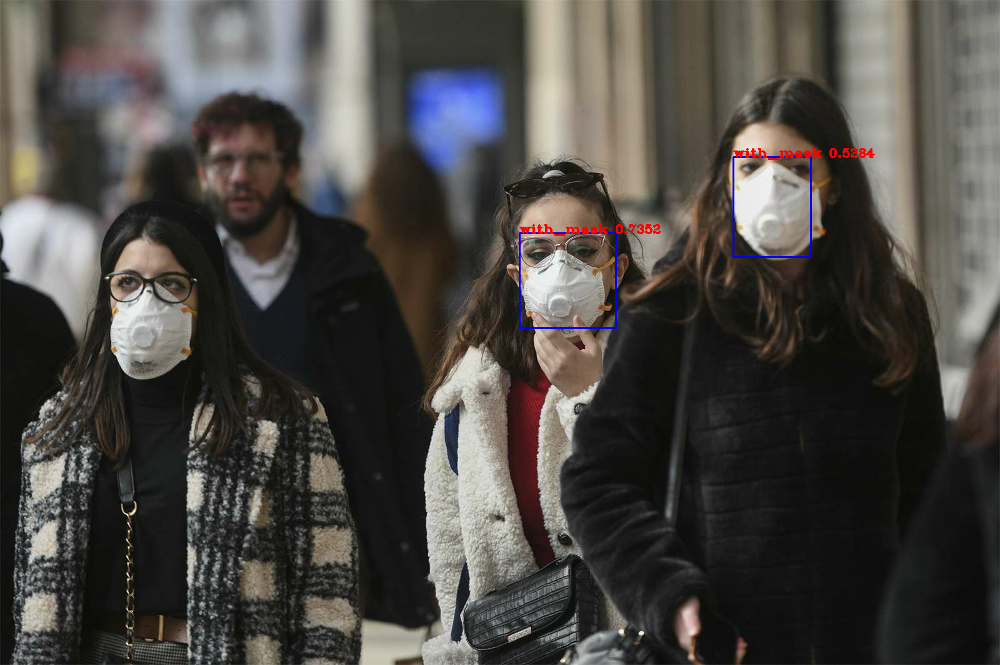

In [118]:
# testing new model with a random image

idx = random.randint(0, len(y_files))

img_raw_test = tf.image.decode_image(
    open('/content/drive/MyDrive/Future Preparations/Computer Vision Training/Object Detection Project/YOLOv3/Women-wearing-facemasks-while-walking-outdoors-Milan-Italy-February-2020-coronavirus-COVID-19.jpg', 'rb').read(), channels=3)
img_test = tf.expand_dims(img_raw_test, 0)
img_test = preprocess_imgs(img_test, 416)
test_output = yolo_box_pred(new_model, classes=3)(img_test)
img_test = cv2.cvtColor(img_raw_test.numpy(), cv2.COLOR_RGB2BGR)
#img = draw_outputs(img, (boxes, scores, classes, nums), class_names)
img_test = draw_outputs(img_test, test_output[0], new_labels)
print(int(test_output[0][-1]))
for i in range(test_output[0][-1]):
  print(new_labels[int(test_output[0][2][i])], 
        np.array(test_output[0][1][i], np.float32), 
        np.array(test_output[0][0][i], np.float32))

cv2_imshow(img_test)

Yes, the newly trained model is not great, mainly because the model can't learn enough data for long enough time. But the point of training this model is to test out the learning process of the model and show that the model can actually learn despite having those limitiation.

Here are some things that can be done to improve the accuracy of the model:
>- Use bigger and more balanced dataset
>- Train with a better GPU so the model can train more in less time